# Visualising the optical and X-ray positions on XMM images

We show the original optical position and X-ray position determined in this work on XMM images.

## Import statements

In [1]:
import pandas as pd
import numpy as np
from astropy.units import Quantity
from astropy.cosmology import LambdaCDM
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import ImageNormalize, LogStretch, MinMaxInterval
from astropy.convolution import convolve, Gaussian2DKernel
import os
from shutil import rmtree
from legacystamps import download as ls_download
import matplotlib
from matplotlib import pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.colors import LinearSegmentedColormap

from tqdm import tqdm

import xga
# This just sets the number of cores this analysis is allowed to use
xga.NUM_CORES = 10
# This is a bodge that will only work because xga_output in notebooks has already been defined, XGA
#  will be made to handle this more gracefully at some point
temp_dir = xga.OUTPUT
actual_dir = temp_dir.split('notebooks/visualisation/')[0]+'xga_output/'
xga.OUTPUT = actual_dir
xga.utils.OUTPUT = actual_dir
# As currently XGA will setup an xga_output directory in our current directory, I remove it to keep it all clean
if os.path.exists('xga_output'):
    rmtree('xga_output')
from xga.samples import BaseSample
from xga.sas import emosaic
from xga.products import Image
from xga.imagetools.misc import pix_deg_scale
from xga.sourcetools.misc import ang_to_rad

%matplotlib inline

## Defining useful functions

Here we set up any functions that might be useful for this notebook:

In [2]:
def make_xray_optpos_im(src, min_val=None, max_val=None):
    rel_opt = opt_samp[opt_samp['name'] == src.name].iloc[0]

    if '19670' in src.name:
        grp_name = '19670'
    else:
        grp_name = src.name

    rel_mems = mem_gal_samp[mem_gal_samp['group_id'] == grp_name]

    opt_pos = Quantity(rel_opt[['opt_ra', 'opt_dec']], 'deg')
    pos_err = Quantity(rel_opt[['opt_ra_err', 'opt_dec_err']], 'deg').max()

    print(src.name)
    rt = src.get_combined_ratemaps()
    
    print('Max count-rate of ratemap is ' + str(rt.data.max()))
    
    if any([len(r) != 1 for o, r in src._initial_regions.items()]):
        rt.regions = src._initial_regions

    pix_rad = (pos_err/pix_deg_scale(opt_pos, rt.radec_wcs)).value

    # Ideally I would just pass the whole chunk of RA-Dec coordinates in, but the way this method is
    #  designed at the moment it fails outright if there are <0 pixel coords - I'll add a way to make that
    #  more graceful at some point
    #     mem_pix = rt.coord_conv(Quantity(rel_mems[['ra_gal', 'dec_gal']], 'deg'), 'pix').value
    mem_pix = []
    vels = []
    for row_ind, row in rel_mems.iterrows():
        try:
            mem_pix.append(rt.coord_conv(Quantity(row[['ra_gal', 'dec_gal']], 'deg'), 'pix').value)
            vels.append(row['delt_vel'])
        except ValueError:
            pass
    mem_pix = np.array(mem_pix)

    # First version with member galaxies - member galaxy markers are coloured by their delta-velocity
    #  from the group mean
    fig = plt.figure(figsize=(10, 8))
    ax = fig.gca()
    ax = rt.get_view(ax, Quantity([opt_pos, src.ra_dec]), zoom_in=True, view_regions=True, 
                back_bin_pix=[pix_rad, pix_rad], low_val_lim=min_val, upp_val_lim=max_val)

    sc = plt.scatter(mem_pix[:, 0], mem_pix[:, 1], marker='D', s=30, c=vels, cmap='rainbow', 
                     label='Member Galaxies')
    cbar = plt.colorbar()
    cbar.ax.set_ylabel(r'$\Delta v_{\rm{gal}}}$', fontsize=15)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # The member galaxies here are just all white
    fig = plt.figure(figsize=(8, 8))
    ax = fig.gca()
    ax = rt.get_view(ax, Quantity([opt_pos, src.ra_dec]), zoom_in=True, view_regions=True, 
                back_bin_pix=[pix_rad, pix_rad], low_val_lim=min_val, upp_val_lim=max_val)

    plt.plot(mem_pix[:, 0], mem_pix[:, 1], 'D', color='white', label='Member Galaxies', markersize=3.7, 
             markerfacecolor='None')
    plt.legend()
    plt.tight_layout()
    plt.savefig('../../outputs/figures/xray_ims/{n}_optxraypos_withmemgal_XMM52_FoV.png'.format(n=src.name))
    plt.show()

    # This is without member galaxies, and saved to disk
    rt.save_view('../../outputs/figures/xray_ims/{n}_optxraypos_XMM52_FoV.png'.format(n=src.name), 
                 Quantity([opt_pos, src.ra_dec]), zoom_in=True, view_regions=True, 
                 back_bin_pix=[pix_rad, pix_rad])

    

## Reading the sample file

This sample file is required again so that we know the central coordinates and redshifts of the groups.

In [3]:
samp = pd.read_csv('../../sample_files/init_group_info.csv')
samp = samp[samp['name'] != 'PHL1811']
samp

,name,est_ra,est_dec,redshift
0,25124,243.629055,26.730240,0.186
1,44739,229.793620,28.331750,0.118
2,19670A,150.256710,50.793942,0.134
3,19670B,150.214920,50.805014,0.134
4,12833,129.496800,44.248700,0.145
5,44858,230.112000,28.887750,0.127
7,50433,157.758000,30.862000,0.136


## Reading sample of optical positions

In [4]:
opt_samp = pd.read_csv('../../sample_files/opt_group_info.csv')
opt_samp

,name,opt_ra,opt_ra_err,opt_dec,opt_dec_err,redshift,ov_obs_ad,r_obs_ad,quasar,OVI_det
0,25124,243.538,0.015,26.687,0.006,0.186,448.0,1167.0,B1612+266,True
1,44739,229.822,0.019,28.342,0.058,0.118,336.0,1135.0,FBQS1519+2838,True
2,19670A,150.178,0.028,50.784,0.007,0.134,404.0,991.0,SBS0956+509,False
3,19670B,150.178,0.028,50.784,0.007,0.134,404.0,991.0,SBS0956+509,False
4,12833,129.400,0.013,44.282,0.010,0.145,444.0,1396.0,RBS711,False
5,44858,230.084,0.035,28.873,0.008,0.127,569.0,1546.0,FBQS1519+2838,True
6,PHL1811,NaN,NaN,NaN,NaN,0.077,NaN,NaN,PHL1811,True
7,50433,157.732,0.003,30.845,0.006,0.136,338.0,600.0,FBQSJ1030+3102,False


## Reading sample of member galaxies

In [5]:
mem_gal_samp = pd.read_csv("../../sample_files/member_galaxies.csv", dtype={'group_id': str})
mem_gal_samp = mem_gal_samp[mem_gal_samp['group_id'].isin(list(opt_samp['name'])+['19670'])]
mem_gal_samp

,group_id,gal_name,ra_gal,dec_gal,z_gal,L_gal,spec_type,delt_rho,delt_vel,p_mem
0,12833,rbs711_126_554,129.398389,44.325363,0.14572,0.575,A,323,-316.0,99.6
1,12833,rbs711_135_607,129.383140,44.296795,0.14519,0.998,A,265,-455.0,99.5
2,12833,1237654652565651620,129.394131,44.314455,0.14505,1.660,A,261,-492.0,99.5
3,12833,rbs711_123_564,129.410462,44.330803,0.14518,1.050,C,340,-457.0,99.5
4,12833,rbs711_143_470,129.334488,44.319729,0.14485,1.440,A,631,-544.0,99.4
...,...,...,...,...,...,...,...,...,...,...
624,50433,fbqs1030_168_703,157.789722,30.856916,0.13856,0.823,A,362,678.0,90.3
625,50433,fbqs1030_176_808,157.763286,30.824806,0.13372,1.000,C,378,-599.0,79.6
626,50433,fbqs1030_179_728,157.750955,30.846392,0.13887,0.312,A,169,760.0,79.0
627,50433,fbqs1030_148_992,157.901502,30.807314,0.13497,1.300,C,1293,-269.0,75.5


In [6]:
mem_gal_samp['group_id'].value_counts()

group_id
44858    99
44739    59
12833    50
19670    48
25124    29
50433    25
Name: count, dtype: int64

## Declaring an XGA sample

A BaseSample object is declared, rather than an ExtendedSample or a ClusterSample, because initially we do not want any automated region matching to take place. From past work we know that some of these groups are very low surface brightness, and in some the major visible contribution to X-ray emission is from member galaxies.

This sample will not match to region files, but we can still use it to create images on which regions can be overlaid:

In [7]:
srcs = BaseSample(samp['est_ra'].values, samp['est_dec'].values, samp['redshift'].values, samp['name'].values)

Declaring BaseSource Sample: 100%|██████████| 7/7 [00:12<00:00,  1.82s/it]


## Generate combined ratemaps

If a 'proper' ClusterSample had been declared, this process would have been run automatically, but in this case we manually generate combined 0.5-2.0 keV ratemaps by calling emosaic (with the default `lo_en=Quantity(0.5, 'keV')` and `hi_en=Quantity(2.0, 'keV')` values) separately for images and exposure maps. The count-rate maps are created automatically when a matching pair of image and exposure map are detected: 

In [8]:
emosaic(srcs, 'image')
emosaic(srcs, 'expmap')

## View XMM visualisations of the groups

A ratemap visualisation is created for each group (bar PHL1811), with the original optical position shown as the solid crosshair, and an uncertainty region shown as a dashed circle. The X-ray position determined in this work is shown by the dashed cross-hair. The XCS detection regions are overlaid on both. Rather than looping through the groups, we used one cell for each of them so that we can manually adjust the data range used for plotting, in the hopes of making low surface-brightness systems more obvious:

### 25124

25124
Max count-rate of ratemap is 0.004629320859885461


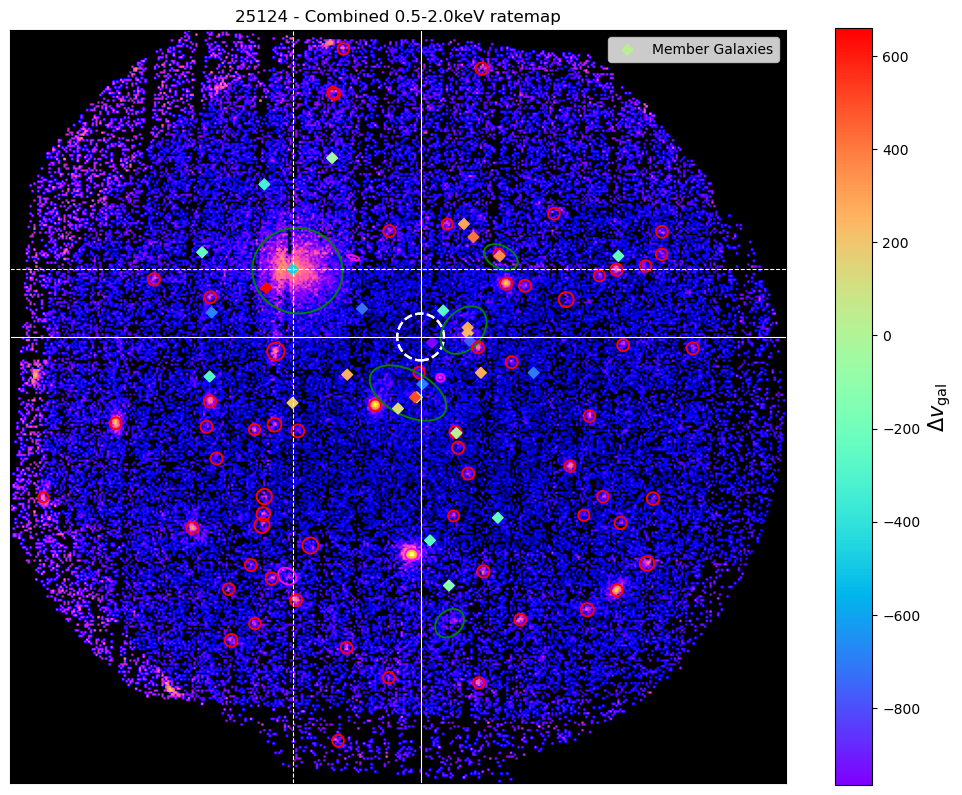

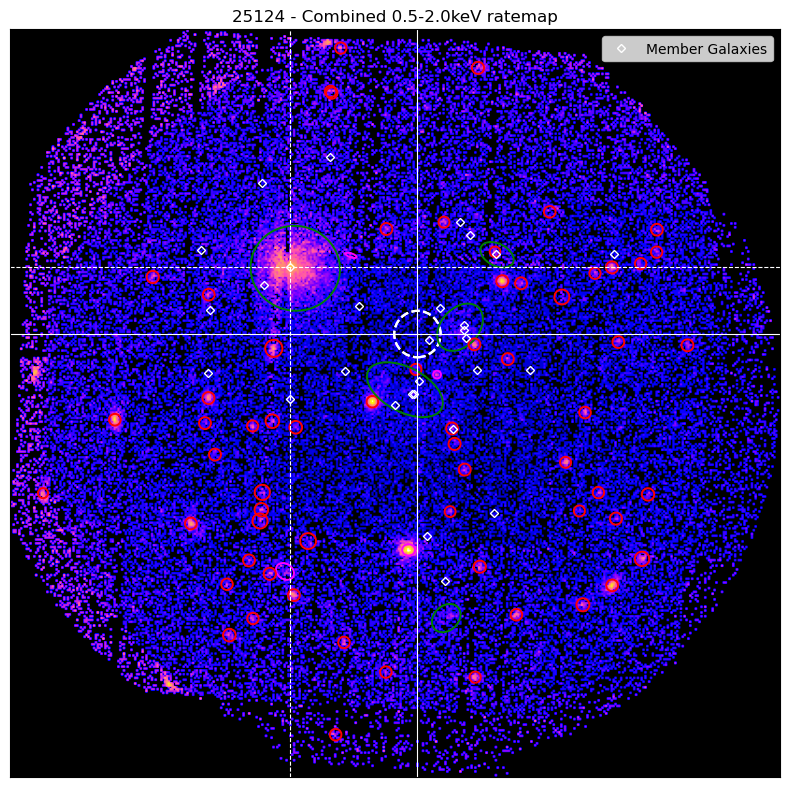

In [9]:
make_xray_optpos_im(srcs[0]) # , min_val=0, max_val=0.001

### 44739

44739
Max count-rate of ratemap is 0.04843926465979576


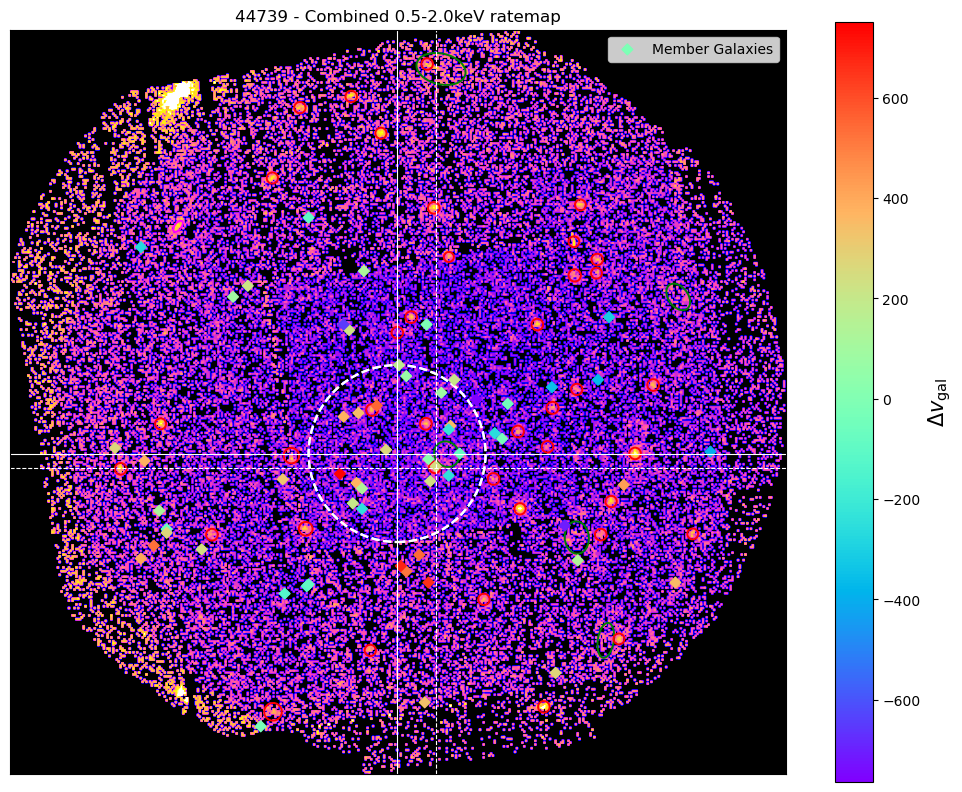

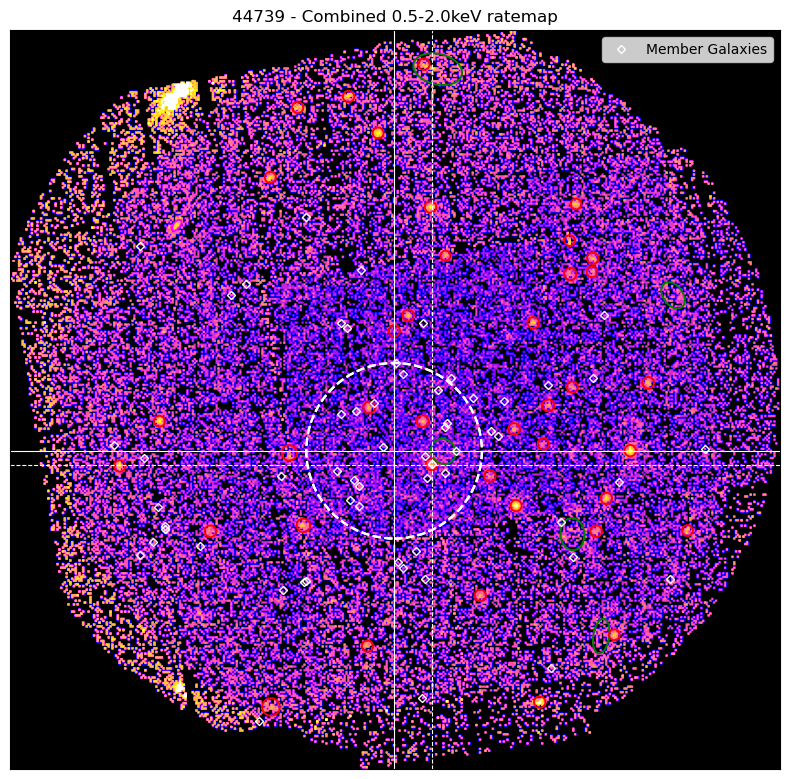

In [10]:
# make_xray_optpos_im(srcs[1], min_val=0, max_val=0.001)
make_xray_optpos_im(srcs[1], min_val=0, max_val=0.001)

### 19670A

19670A
Max count-rate of ratemap is 0.07474576164865865


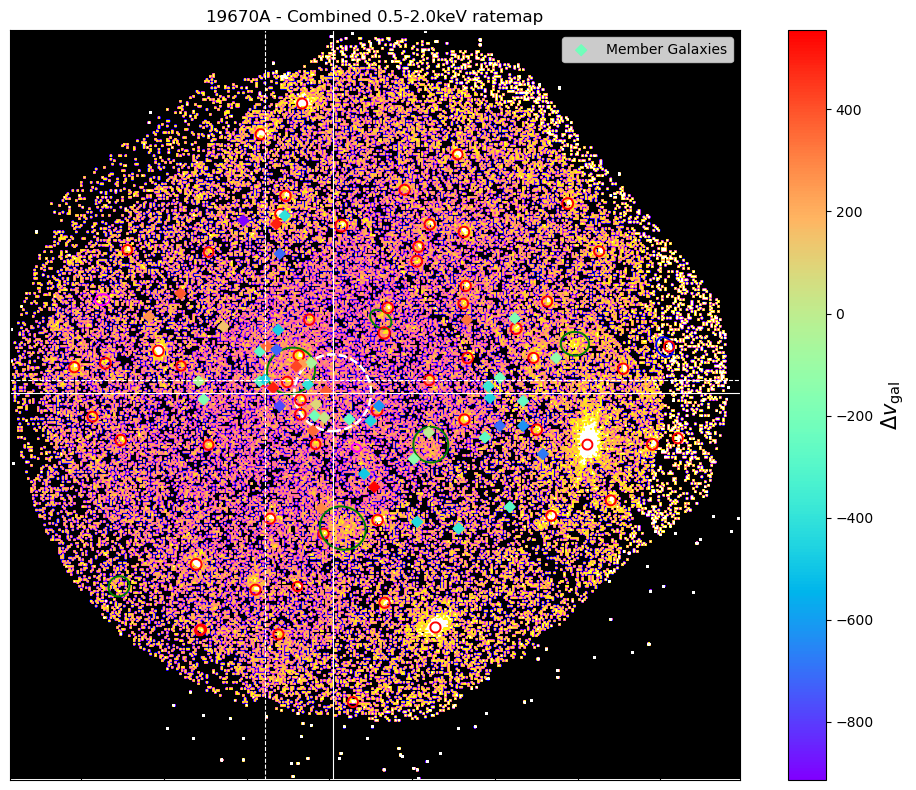

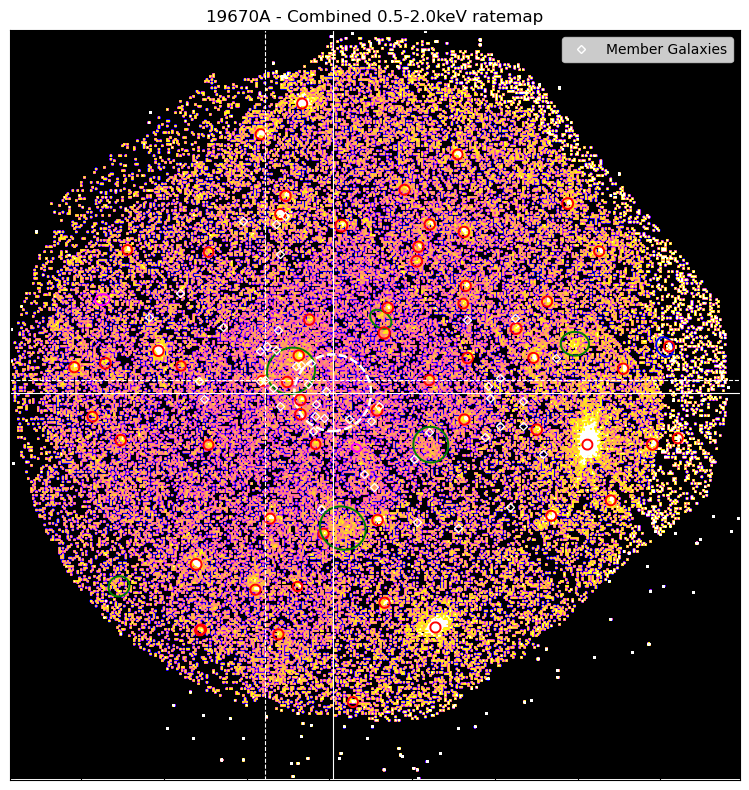

In [11]:
make_xray_optpos_im(srcs[2], min_val=0, max_val=0.0002)

### 19670B

19670B
Max count-rate of ratemap is 0.07474576164865865


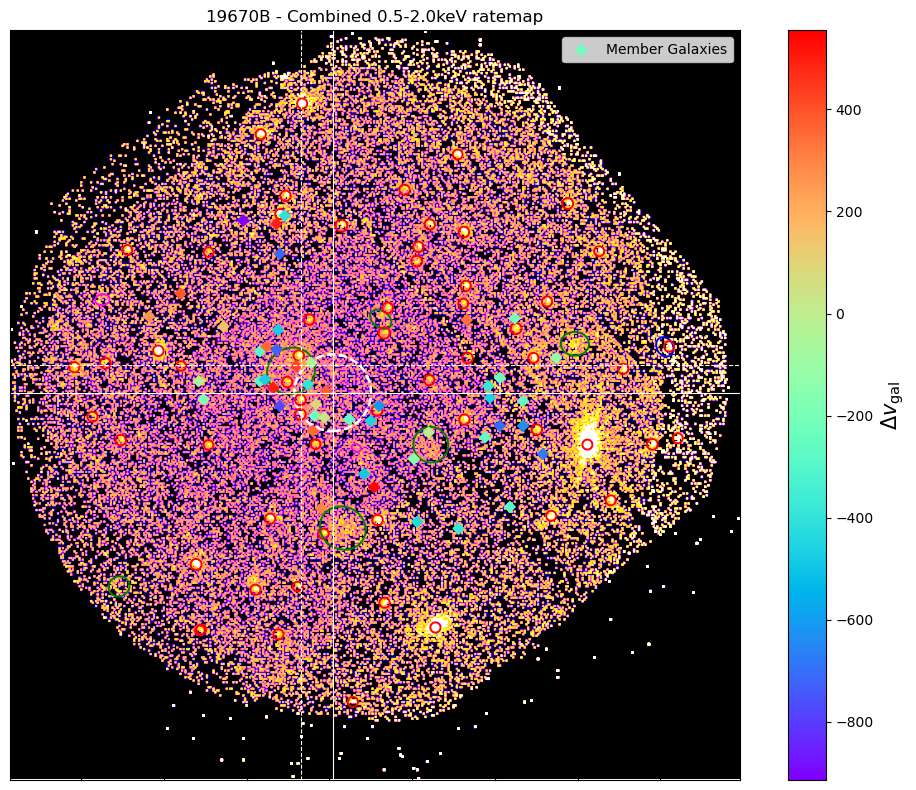

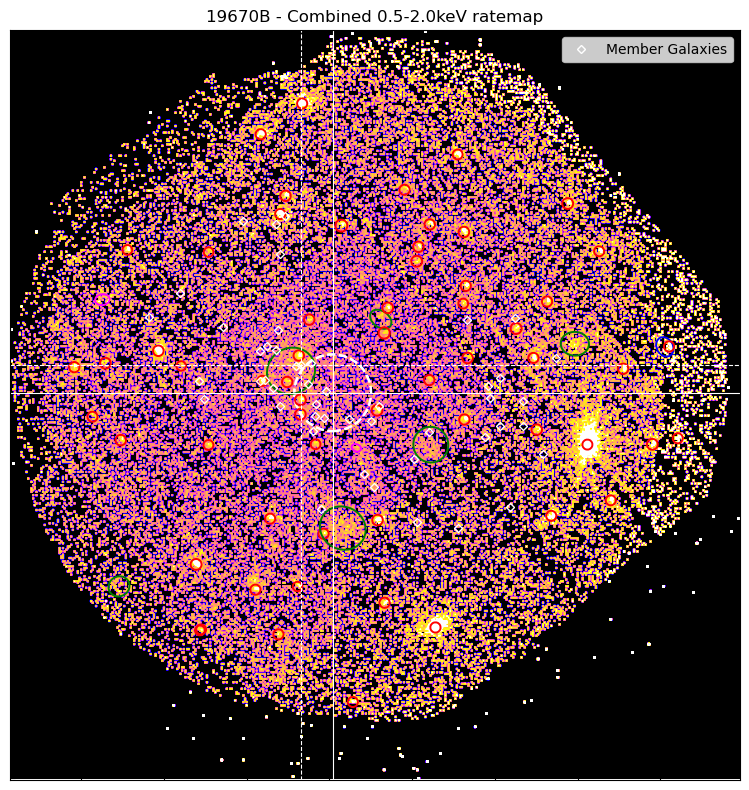

In [12]:
make_xray_optpos_im(srcs[3], min_val=0, max_val=0.0002)

### 12833

12833
Max count-rate of ratemap is 0.0618045435535519


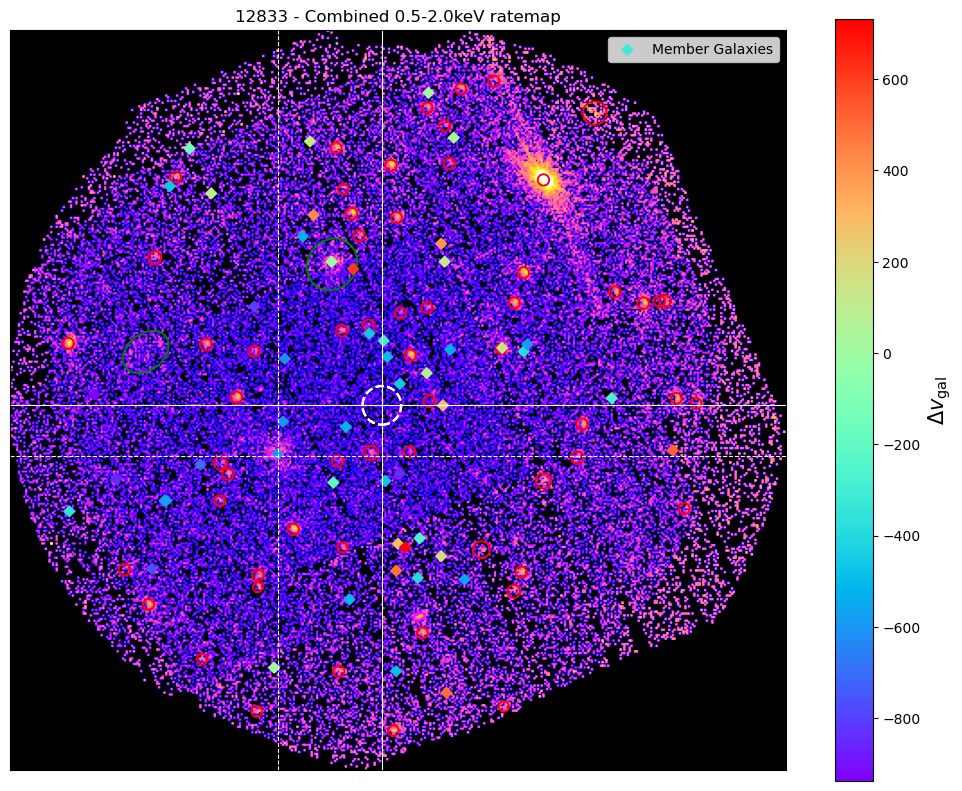

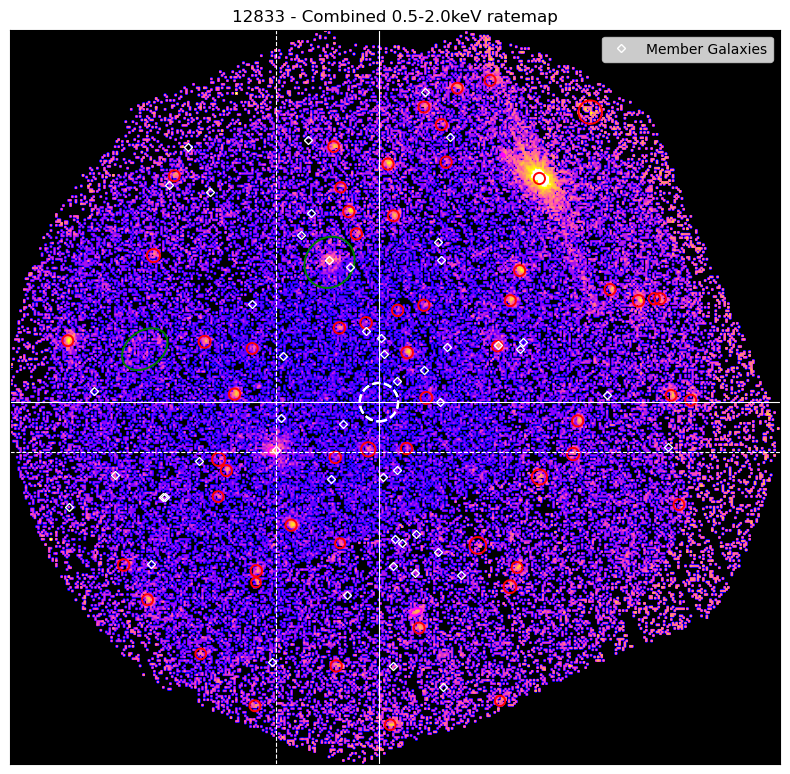

In [13]:
make_xray_optpos_im(srcs[4], min_val=0, max_val=0.002)

We also make a modified verion of the second plot, with inset zooms on the different extended sources we identify:

12833
Max count-rate of ratemap is 0.0618045435535519


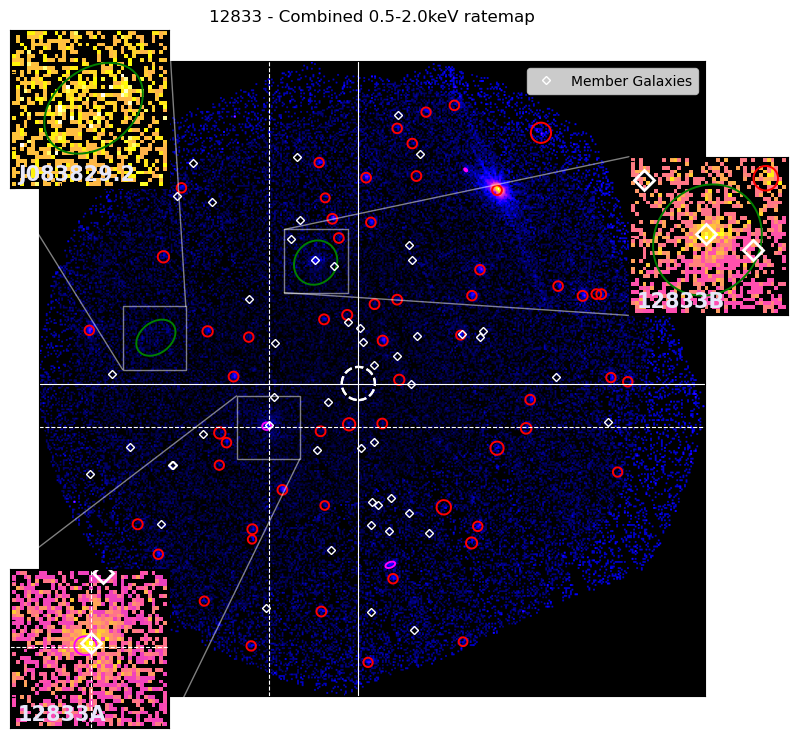

In [66]:
src = srcs['12833']
rel_opt = opt_samp[opt_samp['name'] == src.name].iloc[0]

grp_name = src.name

rel_mems = mem_gal_samp[mem_gal_samp['group_id'] == grp_name]

opt_pos = Quantity(rel_opt[['opt_ra', 'opt_dec']], 'deg')
pos_err = Quantity(rel_opt[['opt_ra_err', 'opt_dec_err']], 'deg').max()

print(src.name)
rt = src.get_combined_ratemaps()

print('Max count-rate of ratemap is ' + str(rt.data.max()))

if any([len(r) != 1 for o, r in src._initial_regions.items()]):
    rt.regions = src._initial_regions

pix_rad = (pos_err/pix_deg_scale(opt_pos, rt.radec_wcs)).value

# Ideally I would just pass the whole chunk of RA-Dec coordinates in, but the way this method is
#  designed at the moment it fails outright if there are <0 pixel coords - I'll add a way to make that
#  more graceful at some point
#     mem_pix = rt.coord_conv(Quantity(rel_mems[['ra_gal', 'dec_gal']], 'deg'), 'pix').value
mem_pix = []
vels = []
for row_ind, row in rel_mems.iterrows():
    try:
        mem_pix.append(rt.coord_conv(Quantity(row[['ra_gal', 'dec_gal']], 'deg'), 'pix').value)
        vels.append(row['delt_vel'])
    except ValueError:
        pass
mem_pix = np.array(mem_pix)

# The member galaxies here are just all white
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax = rt.get_view(ax, Quantity([opt_pos, src.ra_dec]), zoom_in=True, view_regions=True, 
            back_bin_pix=[pix_rad, pix_rad], low_val_lim=None, upp_val_lim=None)

# First zoom-in
zoom_mask = np.zeros(rt.shape)
zoom_cen = rt.coord_conv(src.ra_dec, 'pix').value
pds = pix_deg_scale(src.ra_dec, rt.radec_wcs)
zoom_half_len = ((Quantity(3, 'arcmin') / pds).to('pix') / 2).astype(int).value

zoom_mask[zoom_cen[1]-zoom_half_len:zoom_cen[1]+zoom_half_len, 
          zoom_cen[0]-zoom_half_len:zoom_cen[0]+zoom_half_len] = 1

x1, x2, y1, y2 = -1.5, -0.9, -2.5, -1.9  # subregion of the original image
axins = ax.inset_axes([-0.05, -0.05, 0.25, 0.25], xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])
axins = rt.get_view(axins, Quantity([opt_pos, src.ra_dec]), zoom_mask, zoom_in=True, view_regions=True, 
            back_bin_pix=[pix_rad, pix_rad], low_val_lim=None, upp_val_lim=None, custom_title='')
ax.indicate_inset_zoom(axins, edgecolor="white")
axins.plot(mem_pix[:, 0], mem_pix[:, 1], 'D', color='white', label='Member Galaxies', markersize=10, 
         markerfacecolor='None', mew=2)
axins.annotate('12833A', (0.05, 0.05), fontsize=15, xycoords='axes fraction', color='lavender', weight='bold')

# Second zoom-in
zoom_mask = np.zeros(rt.shape)
zoom_cen = rt.coord_conv(Quantity([129.445, 44.379], 'deg'), 'pix').value
pds = pix_deg_scale(Quantity([129.445, 44.379], 'deg'), rt.radec_wcs)
zoom_half_len = ((Quantity(3, 'arcmin') / pds).to('pix') / 2).astype(int).value

zoom_mask[zoom_cen[1]-zoom_half_len:zoom_cen[1]+zoom_half_len, 
          zoom_cen[0]-zoom_half_len:zoom_cen[0]+zoom_half_len] = 1

x1, x2, y1, y2 = -1.5, -0.9, -2.5, -1.9  # subregion of the original image
axins = ax.inset_axes([0.88, 0.6, 0.25, 0.25], xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])
axins = rt.get_view(axins, mask=zoom_mask, zoom_in=True, view_regions=True, 
            back_bin_pix=[pix_rad, pix_rad], low_val_lim=None, upp_val_lim=None, custom_title='')
ax.indicate_inset_zoom(axins, edgecolor="white")
axins.plot(mem_pix[:, 0], mem_pix[:, 1], 'D', color='white', label='Member Galaxies', markersize=10, 
         markerfacecolor='None', mew=2)
axins.annotate('12833B', (0.05, 0.05), fontsize=15, xycoords='axes fraction', color='lavender', weight='bold')

# Third zoom-in
zoom_mask = np.zeros(rt.shape)
zoom_cen = rt.coord_conv(Quantity([129.622, 44.318], 'deg'), 'pix').value
pds = pix_deg_scale(Quantity([129.622, 44.318], 'deg'), rt.radec_wcs)
zoom_half_len = ((Quantity(3, 'arcmin') / pds).to('pix') / 2).astype(int).value

zoom_mask[zoom_cen[1]-zoom_half_len:zoom_cen[1]+zoom_half_len, 
          zoom_cen[0]-zoom_half_len:zoom_cen[0]+zoom_half_len] = 1

x1, x2, y1, y2 = -1.5, -0.9, -2.5, -1.9  # subregion of the original image
axins = ax.inset_axes([-0.05, 0.8, 0.25, 0.25], xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])
axins = rt.get_view(axins, mask=zoom_mask, zoom_in=True, view_regions=True, 
            back_bin_pix=[pix_rad, pix_rad], low_val_lim=None, upp_val_lim=None, custom_title='')
ax.indicate_inset_zoom(axins, edgecolor="white")
axins.plot(mem_pix[:, 0], mem_pix[:, 1], 'D', color='white', label='Member Galaxies', markersize=10, 
         markerfacecolor='None', mew=2)
axins.annotate('J083829.2', (0.05, 0.05), fontsize=15, xycoords='axes fraction', color='lavender', 
               weight='bold')


plt.plot(mem_pix[:, 0], mem_pix[:, 1], 'D', color='white', label='Member Galaxies', markersize=3.7, 
         markerfacecolor='None')

plt.legend()
plt.tight_layout()
plt.savefig('../../outputs/figures/xray_ims/{n}_optxraypos_withmemgal_XMM52_FoV_withzooms.png'.format(n=src.name))
plt.show()

In [51]:
coord_to_name(Quantity([129.622, 44.318], 'deg'))

'J083829.2+441904.8'

### 44858

44858
Max count-rate of ratemap is 0.007261356423063981


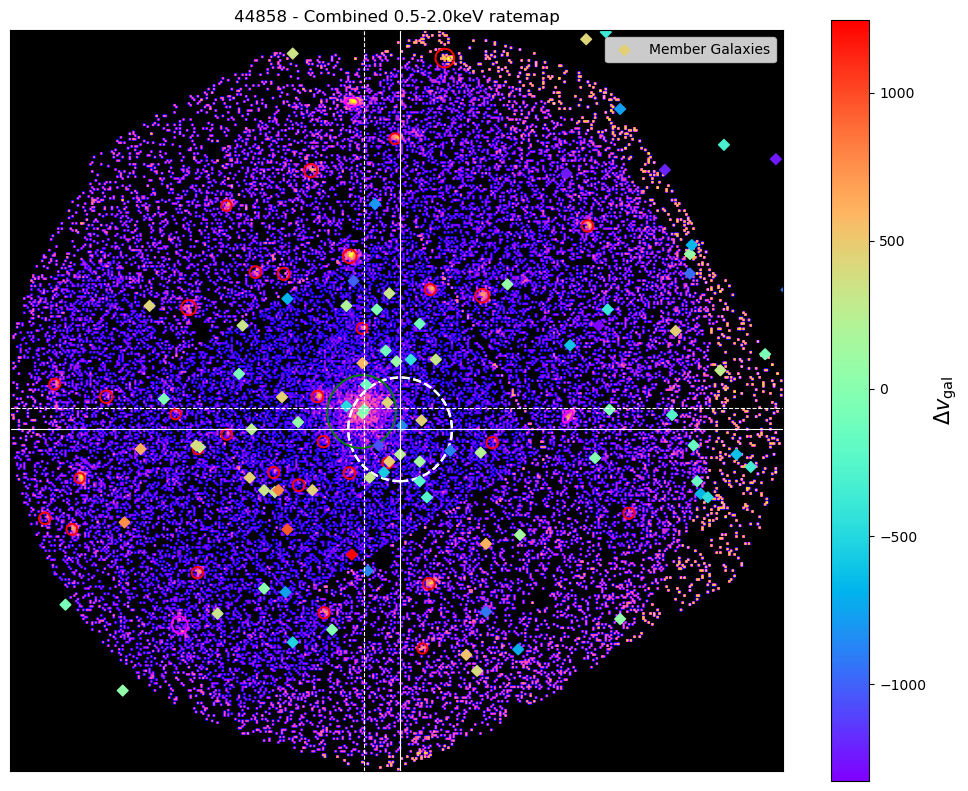

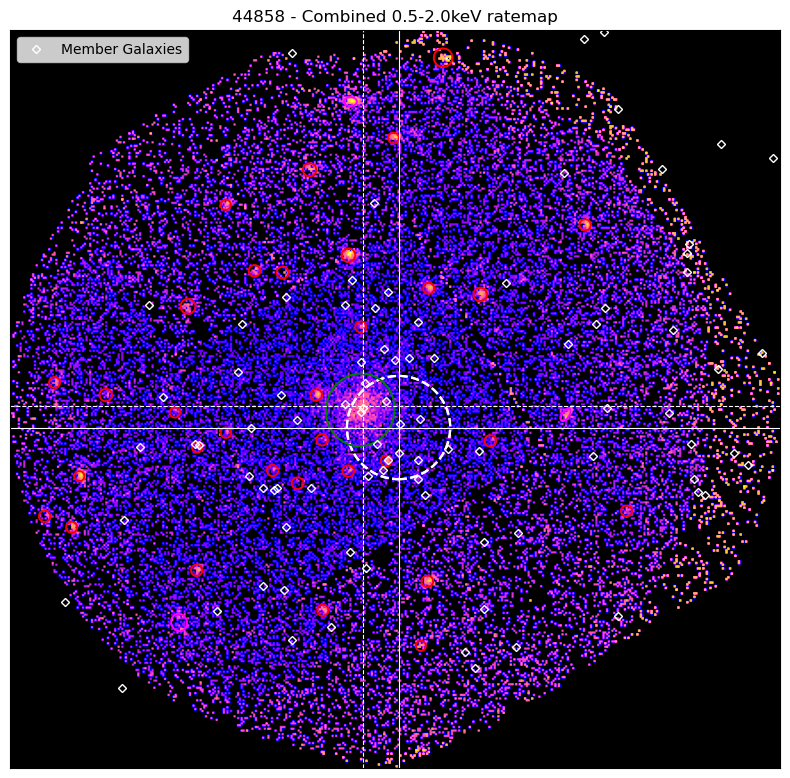

In [14]:
make_xray_optpos_im(srcs[5])

### 50433

50433
Max count-rate of ratemap is 0.06629592393302058


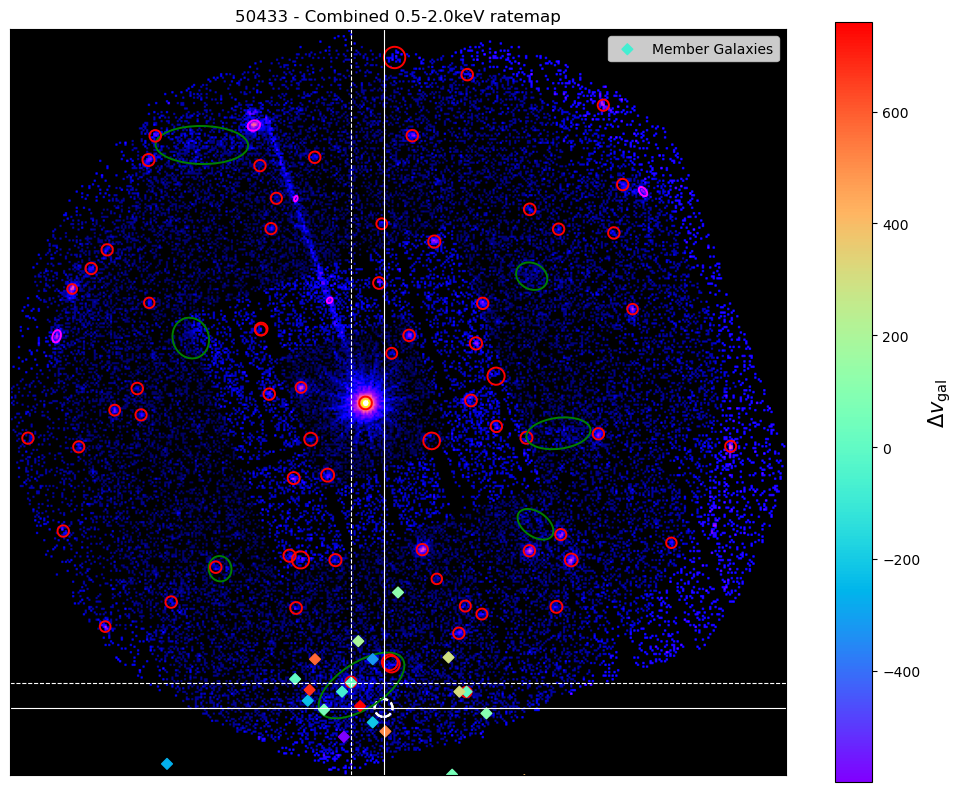

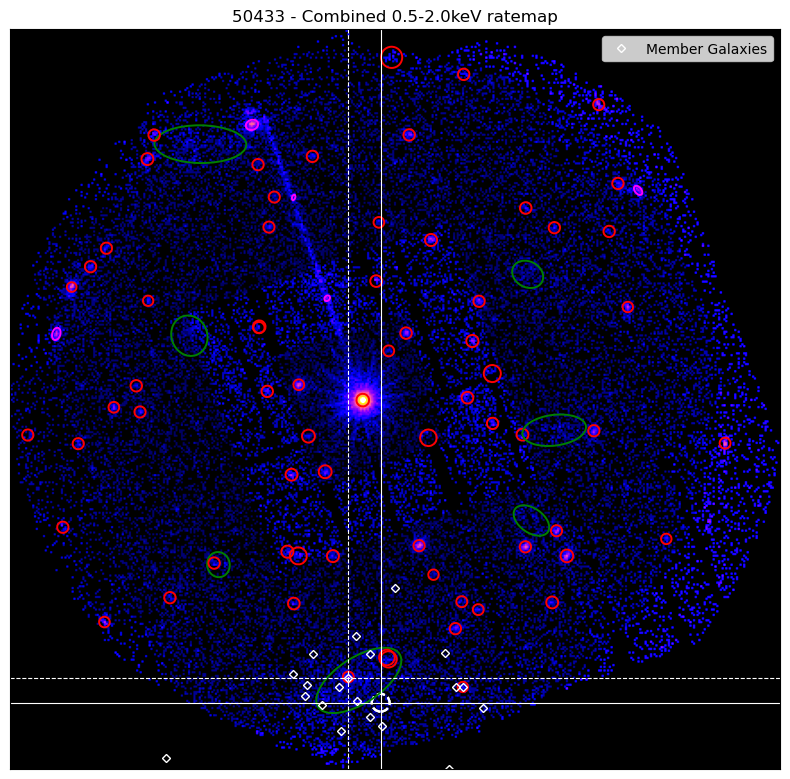

In [15]:
make_xray_optpos_im(srcs[6], min_val=0, max_val=0.02)

## Difference between X-ray and optical centre

Here we create a figure to demonstrate the difference between the optical and X-ray defined centres for all of the groups on a single axis, simply subtracting the optical position from the X-ray and plotting the difference:

In [ ]:
plt.figure(figsize=(6, 6))

# Set up the ticks on the x and y axes
plt.minorticks_on()
plt.tick_params(which='both', direction='in', top=True, right=True)

# Adding a crosshair to emphasise the zero point
plt.axhline(0, linestyle='dotted', color='black', linewidth=0.8)
plt.axvline(0, linestyle='dotted', color='black', linewidth=0.8)

pnt_mark = ['x', 'D', '.', '+', '1', 'P', 'X']
for src_ind, src in enumerate(srcs):
    # Retrieving the relevant optical position information
    rel_opt = opt_samp[opt_samp['name'] == src.name].iloc[0]
    opt_pos = Quantity(rel_opt[['opt_ra', 'opt_dec']], 'deg')
    xray_pos = src.ra_dec
    
    # Calculating the difference between the X-ray and optical positions (the optical positions are 
    #  effectively) the zero point of this plot
    delt_ra = xray_pos[0]-opt_pos[0]
    delt_dec = xray_pos[1]-opt_pos[1]
    
#     plt.scatter(delt_ra, delt_dec, marker=pnt_mark[src_ind], label="{}".format(src.name))
    plt.scatter(delt_ra, delt_dec, marker='D', label="{}".format(src.name))

# Set sensible axis limits
plt.xlim(-0.2, 0.2)
plt.ylim(-0.2, 0.2)

# Create labels
plt.xlabel(r'$\Delta$RA [$^{\circ}$]', fontsize=14)
plt.ylabel(r'$\Delta$Dec [$^{\circ}$]', fontsize=14)

# Add legend, plot, and save
plt.legend(loc='best')
plt.savefig('../../outputs/figures/opt_xray_pos_comp.pdf')
plt.show()

In [ ]:
plt.figure(figsize=(6, 6))

# Set up the ticks on the x and y axes
plt.minorticks_on()
plt.tick_params(which='both', direction='in', top=True, right=True)

# Adding a crosshair to emphasise the zero point
plt.axhline(0, linestyle='dotted', color='black', linewidth=0.8)
plt.axvline(0, linestyle='dotted', color='black', linewidth=0.8)

pnt_mark = ['x', 'D', '.', '+', '1', 'P', 'X']
for src_ind, src in enumerate(srcs):
    # Retrieving the relevant optical position information
    rel_opt = opt_samp[opt_samp['name'] == src.name].iloc[0]
    opt_pos = Quantity(rel_opt[['opt_ra', 'opt_dec']], 'deg')
    xray_pos = src.ra_dec
    
    # Calculating the difference between the X-ray and optical positions (the optical positions are 
    #  effectively) the zero point of this plot
    delt_x = ang_to_rad(xray_pos[0]-opt_pos[0], src.redshift, src.cosmo)
    delt_y = ang_to_rad(xray_pos[1]-opt_pos[1], src.redshift, src.cosmo)
    
#     plt.scatter(delt_ra, delt_dec, marker=pnt_mark[src_ind], label="{}".format(src.name))
    plt.scatter(delt_x, delt_y, marker='D', label="{}".format(src.name))

# Set sensible axis limits
plt.xlim(-1100, 1100)
plt.ylim(-1100, 1100)

# Create labels
plt.xlabel(r'$\Delta$RA Proper Distance [kpc]', fontsize=14)
plt.ylabel(r'$\Delta$Dec Proper Distance [kpc]', fontsize=14)

# Add legend, plot, and save
plt.gca().set_aspect(1)
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('../../outputs/figures/opt_xray_pos_kpc_comp.pdf')
plt.show()